In [57]:
%matplotlib inline

In [58]:
import numpy as np
from tqdm.notebook import tqdm
import matplotlib
import matplotlib.pyplot as plt
import cv2  # only use this to read image

In [59]:
# only use cv2 in this cell
original = cv2.imread("data/gates_of_hell.jpeg")
original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)  # converge BGR to RGB array

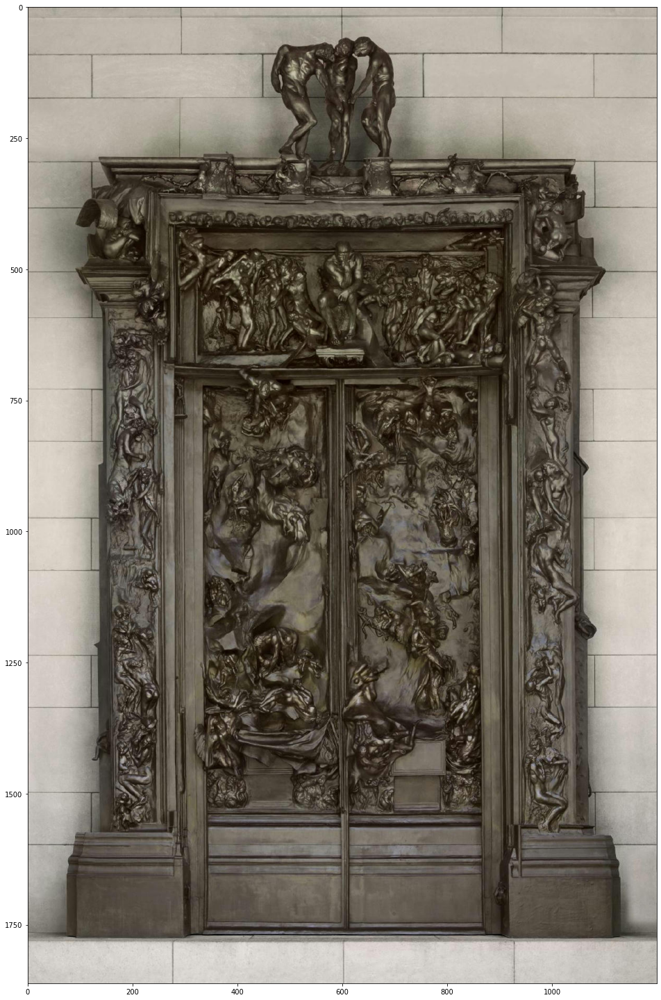

In [60]:
dpi = matplotlib.rcParams['figure.dpi']
height, width, _ = original.shape
figsize = (width / float(dpi), height / float(dpi))
plt.figure(figsize=figsize)
plt.imshow(original)

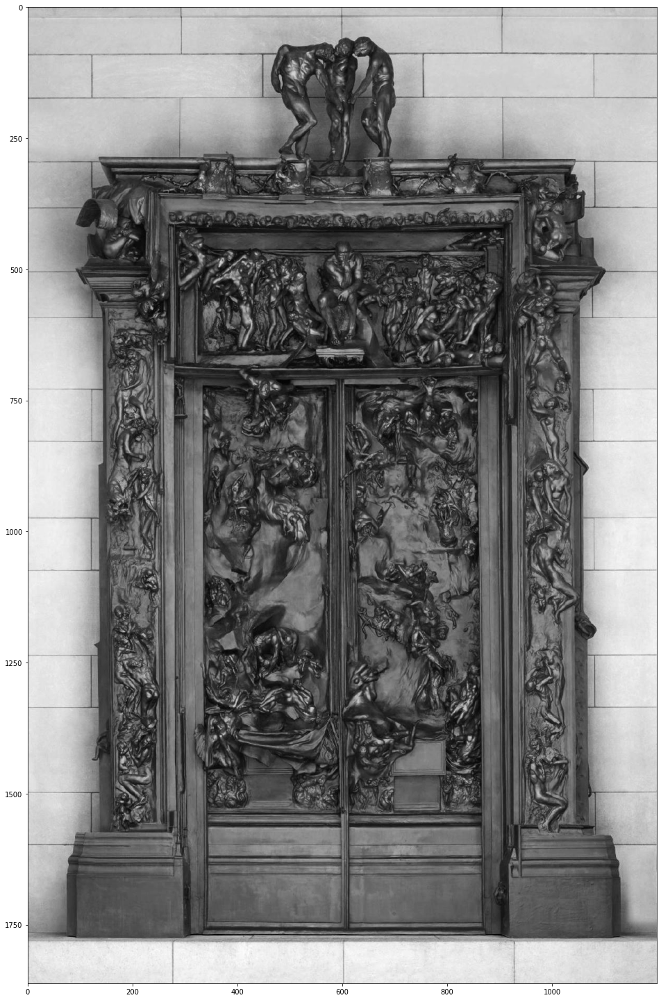

In [61]:
naive_grayscale = np.dot(original[...,:3], [1/3, 1/3, 1/3])
plt.figure(figsize=figsize)
plt.imshow(naive_grayscale, cmap="gray")

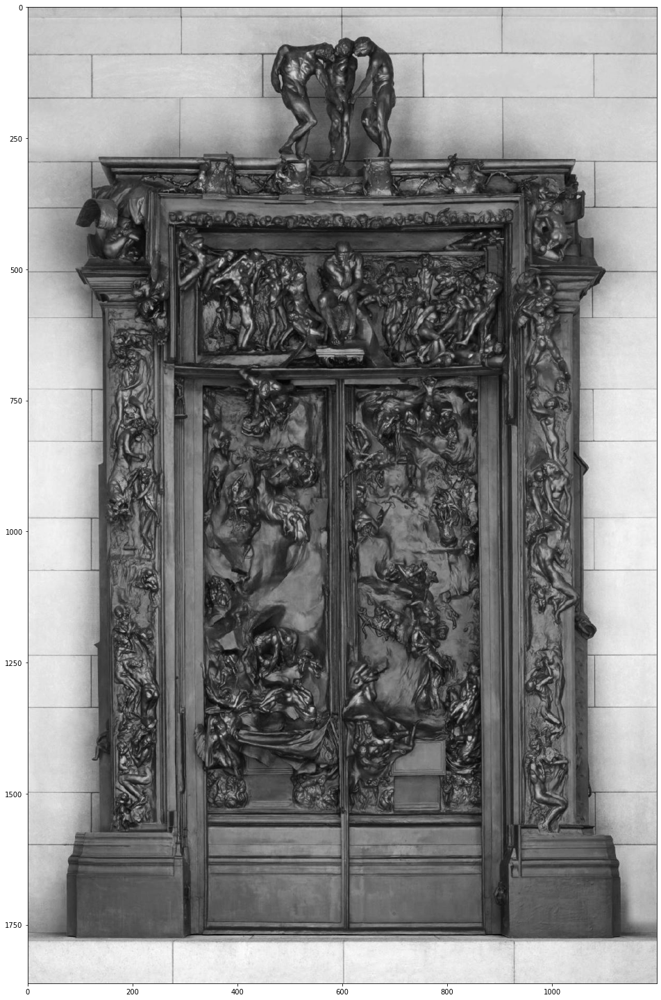

In [62]:
"""
References:
* What is gamma correction? (https://www.youtube.com/watch?v=wFx0d9c8WMs)
* Convert rbg to grayscale (https://e2eml.school/convert_rgb_to_grayscale.html)
"""

red_weight = 0.299
green_weight = 0.587
blue_weight = 0.114
rgb_weights = [red_weight, green_weight, blue_weight]

grayscale = np.dot(original[...,:3], rgb_weights)
plt.figure(figsize=figsize)
plt.imshow(grayscale, cmap="gray")

Text(0.5, 1.0, 'linear approx. of gamma and perceptual luminance correcte')

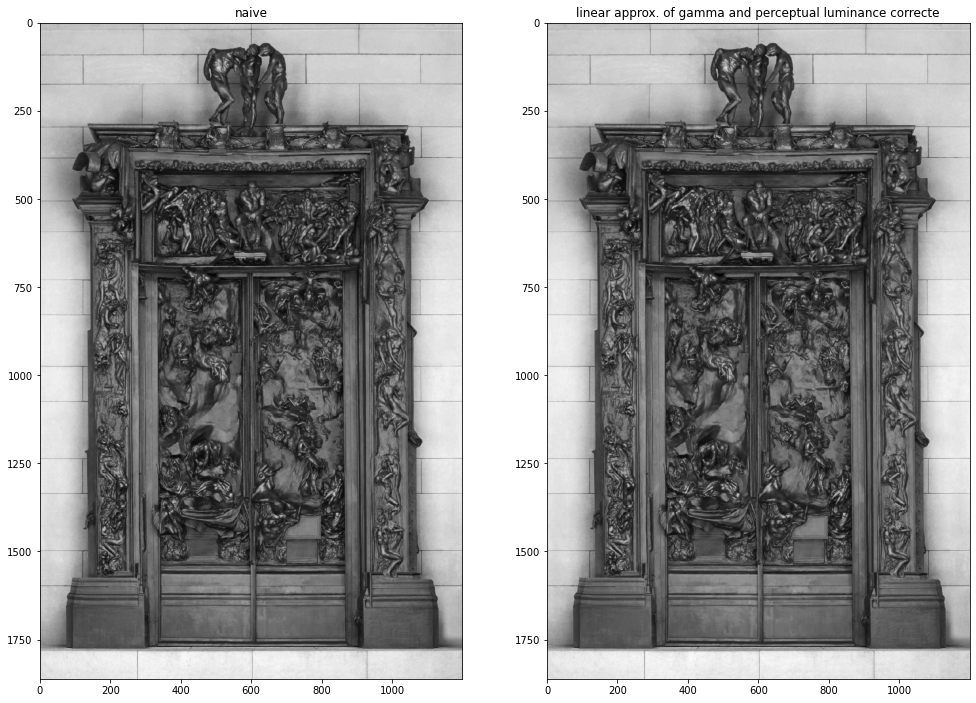

In [63]:
fig, ax = plt.subplots(1, 2, figsize=figsize)
ax[0].imshow(naive_grayscale, cmap="gray")
ax[0].set_title("naive")
ax[1].imshow(grayscale, cmap="gray")
ax[1].set_title("linear approx. of gamma and perceptual luminance correcte")

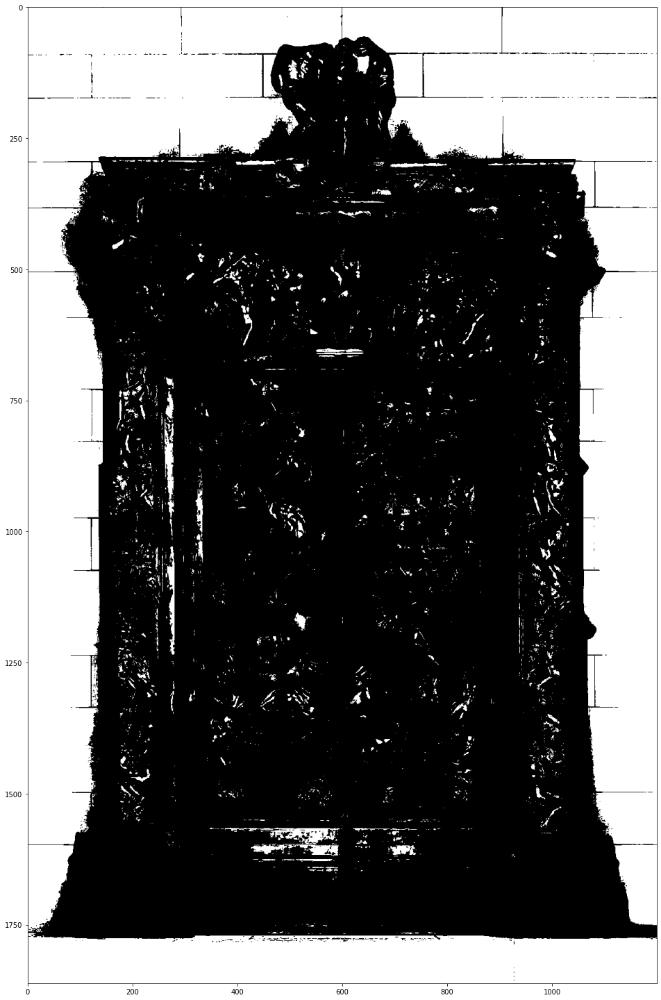

In [64]:
# apply a global threshold
min_rgb_value = 0
max_rgb_value = 255
naive_bw = np.zeros_like(grayscale)
naive_bw[grayscale >= max_rgb_value // 2] = max_rgb_value
plt.figure(figsize=figsize)
plt.imshow(naive_bw, cmap="gray")

  0%|          | 0/256 [00:00<?, ?it/s]

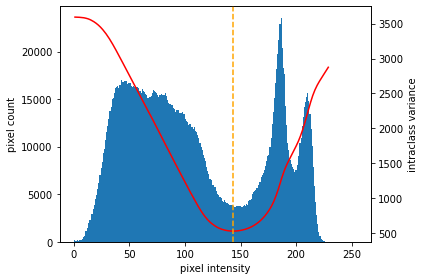

In [65]:
# global thresholding with Otsu's method
# References: https://en.wikipedia.org/wiki/Otsu%27s_method#Limitations_and_variations

fig, ax1 = plt.subplots()

counts, bins, _ = ax1.hist(grayscale.ravel(), bins=np.arange(min_rgb_value, max_rgb_value + 1))
ax1.set_xlabel("pixel intensity")
ax1.set_ylabel("pixel count")

probabilities = bins / np.sum(bins)
intraclass_variances = []
for threshold in tqdm(bins):  # t in [0, 255] (NOTE: 0 = black, 255 = white)
    black_pixels = grayscale[grayscale < threshold]
    white_pixels = grayscale[grayscale >= threshold]

    if not black_pixels.any() or not white_pixels.any():
        intraclass_variance = np.inf
    else:
        black_variance = np.var(black_pixels)
        white_variance = np.var(white_pixels)
        prob_black = np.sum(probabilities[:threshold])
        prob_white = 1 - prob_black
        intraclass_variance = prob_black * black_variance + prob_white * white_variance
    intraclass_variances.append(intraclass_variance)

global_otsu_threshold = np.argmin(intraclass_variances)

ax2 = ax1.twinx()
ax2.plot(intraclass_variances, color="red")
ax2.axvline(global_otsu_threshold, color="orange", linestyle="dashed")
ax2.set_ylabel("intraclass variance")

fig.tight_layout()

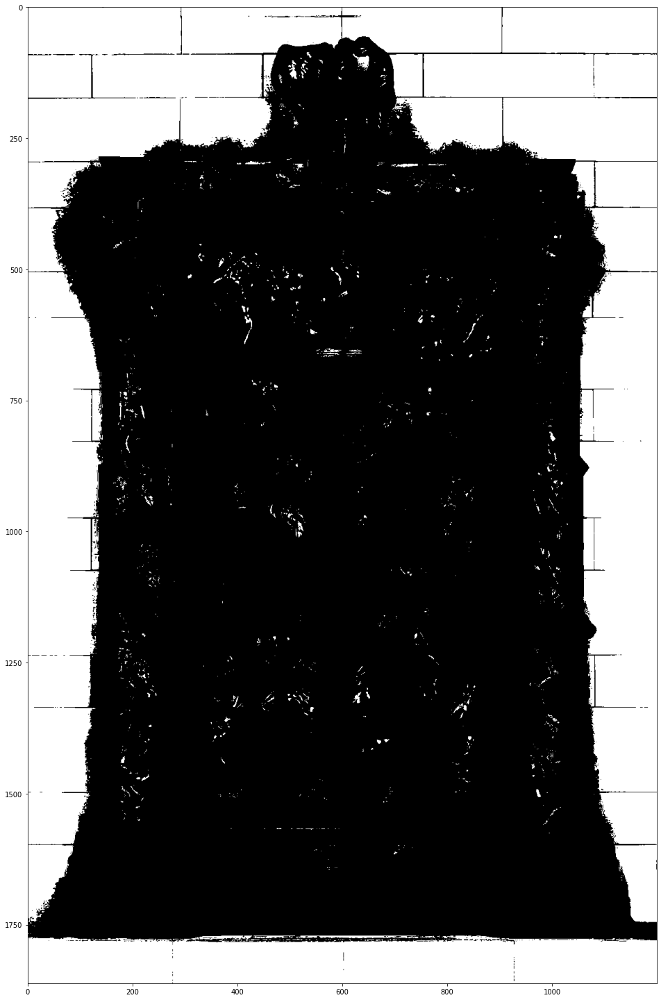

In [66]:
global_otsu_bw = np.zeros_like(grayscale)
global_otsu_bw[grayscale >= global_otsu_threshold] = max_rgb_value
plt.figure(figsize=figsize)
plt.imshow(global_otsu_bw, cmap="gray")

Text(0.5, 1.0, "global Otsu's")

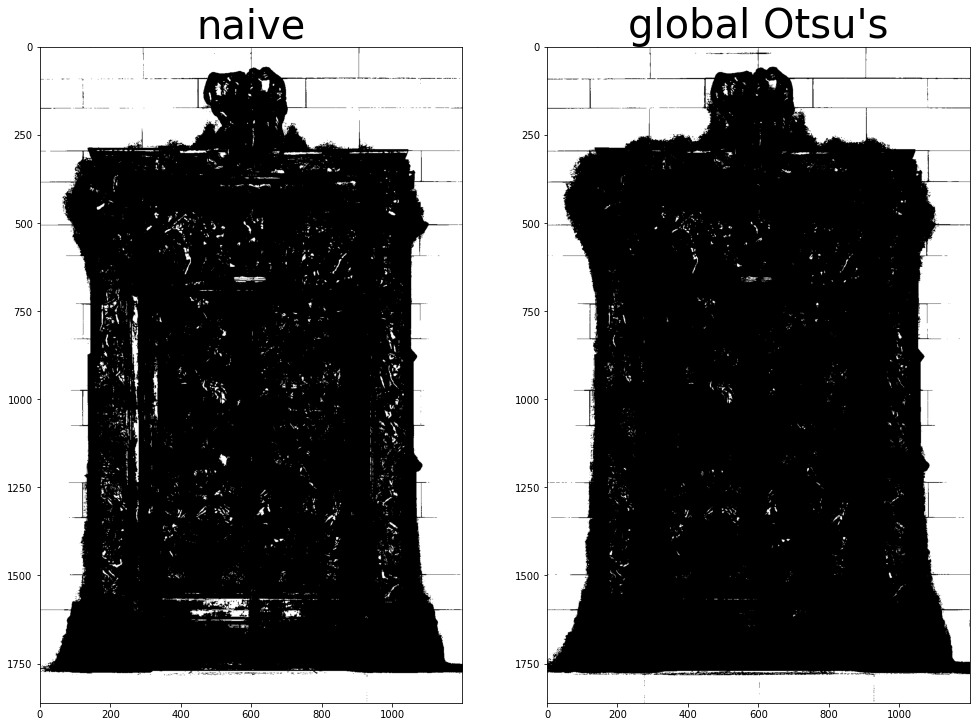

In [67]:
fig, ax = plt.subplots(1, 2, figsize=figsize)
ax[0].imshow(naive_bw, cmap="gray")
ax[0].set_title("naive")
ax[1].imshow(global_otsu_bw, cmap="gray")
ax[1].set_title("global Otsu's")

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1862 [00:00<?, ?it/s]

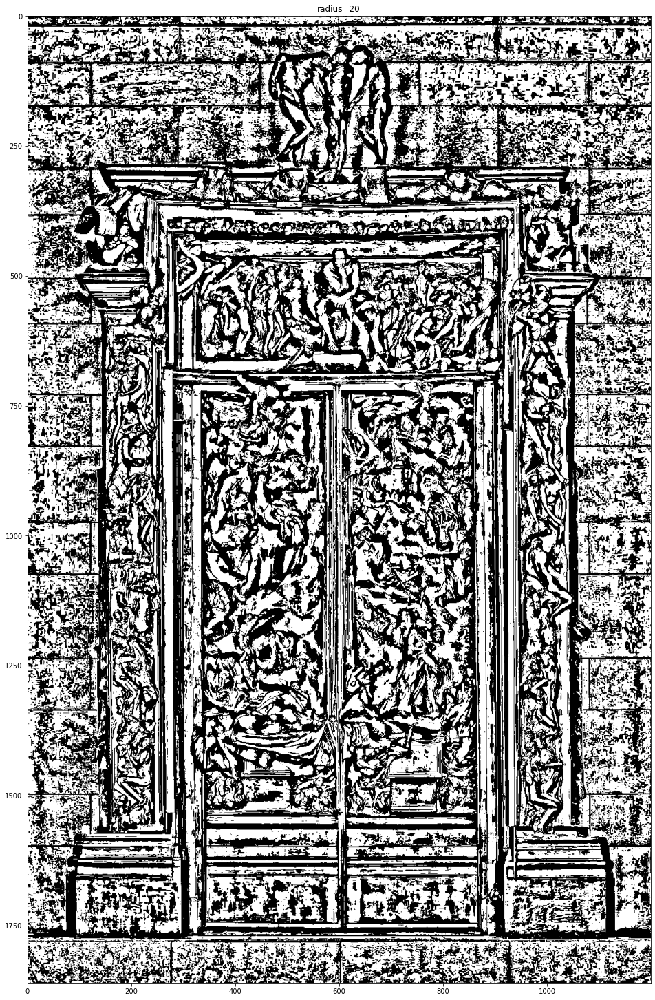

  0%|          | 0/1862 [00:00<?, ?it/s]

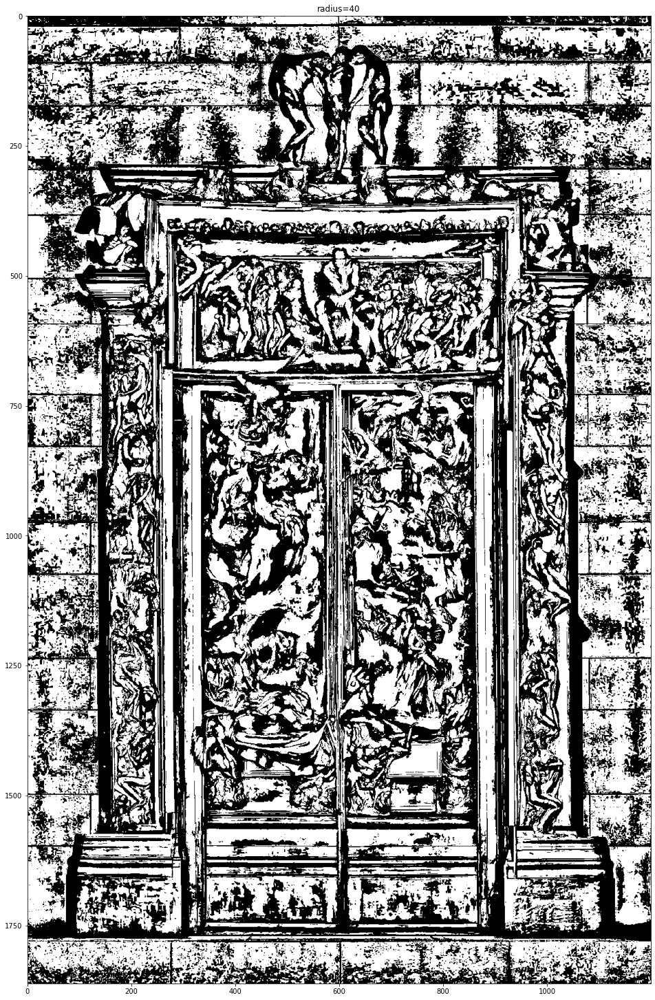

In [87]:
# local median thresholding
radii = [20, 40]
for subplot_index, radius in enumerate(tqdm(radii)):
    max_row, max_col = grayscale.shape
    bw = np.zeros_like(grayscale)
    for i, row in enumerate(tqdm(grayscale, leave=False)):
        ymin = max(0, i - radius)
        ymax = min(max_row, i + radius)
        for j, center in enumerate(row):
            xmin = max(0, j - radius)
            xmax = min(max_col, j + radius)
            window = grayscale[ymin:ymax, xmin:xmax]  # get a square of 2*radius + 1
            if center >= np.median(window):
                bw[i, j] = max_rgb_value
    plt.figure(figsize=figsize)
    plt.imshow(bw, cmap="gray")
    plt.title(f"{radius=}")
    plt.show()

In [91]:
def get_otsu_threshold(img):
    intraclass_variances = []
    num_pixels = np.prod(img.shape)
    for threshold in np.arange(min_rgb_value, max_rgb_value):  # t in [0, 255] (NOTE: 0 = black, 255 = white)
        black_pixels = img[img < threshold]
        white_pixels = img[img >= threshold]

        if not black_pixels.any() or not white_pixels.any():
            intraclass_variance = np.inf
        else:
            black_variance = np.var(black_pixels)
            white_variance = np.var(white_pixels)
            prob_black = len(black_pixels) / num_pixels
            prob_white = len(white_pixels) / num_pixels
            intraclass_variance = prob_black * black_variance + prob_white * white_variance
        intraclass_variances.append(intraclass_variance)

    otsu_threshold = np.argmin(intraclass_variances)
    return otsu_threshold, intraclass_variances

In [ ]:
# local median thresholding
radii = [20, 40]
for subplot_index, radius in enumerate(tqdm(radii)):
    max_row, max_col = grayscale.shape
    bw = np.zeros_like(grayscale)
    for i, row in enumerate(tqdm(grayscale, leave=False)):
        ymin = max(0, i - radius)
        ymax = min(max_row, i + radius)
        for j, center in enumerate(row):
            xmin = max(0, j - radius)
            xmax = min(max_col, j + radius)
            window = grayscale[ymin:ymax, xmin:xmax]  # get a square of 2*radius + 1
            threshold, _ = get_otsu_threshold(window)
            if center >= threshold:
                bw[i, j] = max_rgb_value
    plt.figure(figsize=figsize)
    plt.imshow(bw, cmap="gray")
    plt.title(f"{radius=}")
    plt.show()

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1862 [00:00<?, ?it/s]